# Lab. Corner detection and ORB

At the end of this laboratory, you would get familiarized with

*   Corner Detection using FAST and Harris Corners
*   ORB feature detectors and descriptors

---

In [1]:
# mount drive to the notebook

#from google.colab import drive
#drive.mount('/content/drive')

In [2]:
# Loading necessary libraries (Feel free to add new libraries if you need for any computation)

import numpy as np
from matplotlib import pyplot as plt
import os
from skimage import color, data, feature, filters, io, transform 
from skimage.feature import corner_peaks, corner_fast, corner_harris

# Corner Detection

### Exercise: #1

*    Detect the corners in the image starbucks4.jpg. Use corner_fast to extract FAST corners for the given image and corner_peaks to find corners in the corner measure response image.
*   Show the original image, fast corners, peaks overlayed on the original image using matplotlib subplot.



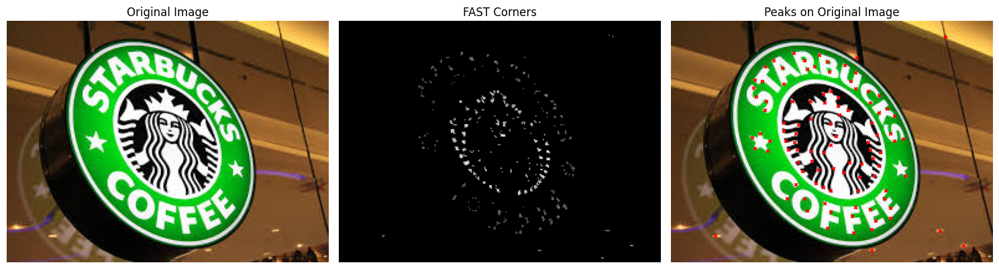

In [3]:
# solution

# Load the image
image = io.imread('images/starbucks/starbucks4.jpg')

# Convert to grayscale
gray_image = color.rgb2gray(image)

# Detect FAST corners
fast_corners = corner_fast(gray_image, n=9, threshold=0.35)

# Find peaks in the corner measure response image
peaks = corner_peaks(fast_corners, min_distance=5)

# Plot the original image
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Plot the FAST corners
plt.subplot(1, 3, 2)
plt.imshow(fast_corners, cmap='gray')
plt.title('FAST Corners')
plt.axis('off')

# Plot peaks overlayed on the original image
plt.subplot(1, 3, 3)
plt.imshow(image)
plt.scatter(peaks[:, 1], peaks[:, 0], c='red', s=10, marker='x')
plt.title('Peaks on Original Image')
plt.axis('off')

plt.tight_layout()
plt.show()

*   Analyze and discuss the effect of changing **'threshold'** in the corner_fast function.

**Solution**

*(Double-click or enter to edit)*

...

*   Repeat the exercise by replacing FAST corners with Harris corners.

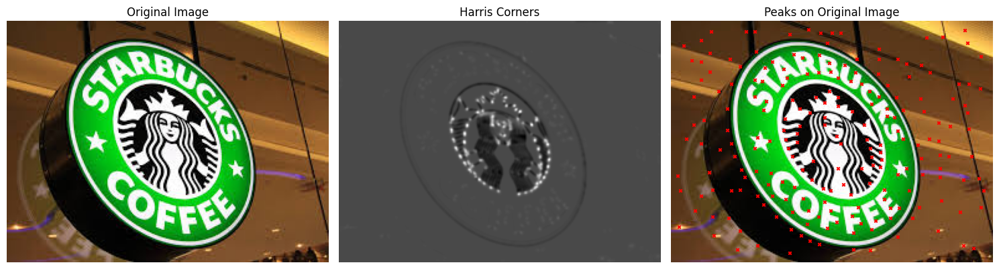

In [4]:
# solution

# solution
# Load the image
image = io.imread('images/starbucks/starbucks4.jpg')

# Convert to grayscale
gray_image = color.rgb2gray(image)

# Detect Harris corners
harris_corners = corner_harris(gray_image)

# Find peaks in the corner measure response image
peaks = corner_peaks(harris_corners, min_distance=5)

# Plot the original image
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Plot the Harris corners
plt.subplot(1, 3, 2)
plt.imshow(harris_corners, cmap='gray')
plt.title('Harris Corners')
plt.axis('off')

# Plot peaks overlayed on the original image
plt.subplot(1, 3, 3)
plt.imshow(image)
plt.scatter(peaks[:, 1], peaks[:, 0], c='red', s=10, marker='x')
plt.title('Peaks on Original Image')
plt.axis('off')

plt.tight_layout()
plt.show()

*   Do you find difference between both the techniques? If so, why and what difference do you observe?

**Solution**

*(Double-click or enter to edit)*

...

# ORB feature detector and binary descriptor

### Exercise #0: Compute ORB descriptors and find descriptors match

*   Load 'astronaut' image from data module.
*   Convert the image to grayscale.
*   Create a copy of the image and rotate it by 180&deg; 



In [5]:
img1 = color.rgb2gray(data.astronaut())
img2 = transform.rotate(img1, 180)

*   Create an ORB feature detector with default parameters. *Hint: ORB feature detector is available in skimage.feature module.*



In [6]:
descriptor_extractor = feature.ORB(n_keypoints=200)

*   Extract the keypoints and descriptors using detect_and_extract function for both the images

In [7]:
descriptor_extractor.detect_and_extract(img1)
keypoints1 = descriptor_extractor.keypoints
descriptors1 = descriptor_extractor.descriptors

descriptor_extractor.detect_and_extract(img2)
keypoints2 = descriptor_extractor.keypoints
descriptors2 = descriptor_extractor.descriptors

*   Descriptors can be matched using match_descriptors function available in skimage.feature module
*   The matches can be plotted using the plot_matches function available in skimage.feature module

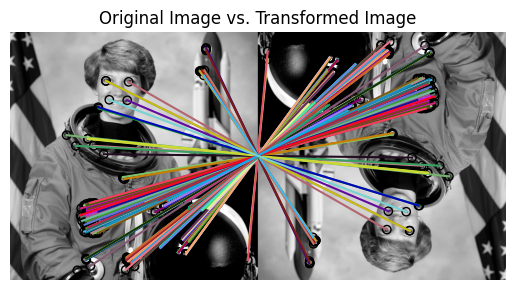

In [8]:
matches12 = feature.match_descriptors(descriptors1, descriptors2, cross_check=True)
feature.plot_matches(plt, img1, img2, keypoints1, keypoints2, matches12)
plt.axis('off')
plt.title("Original Image vs. Transformed Image")
plt.show()

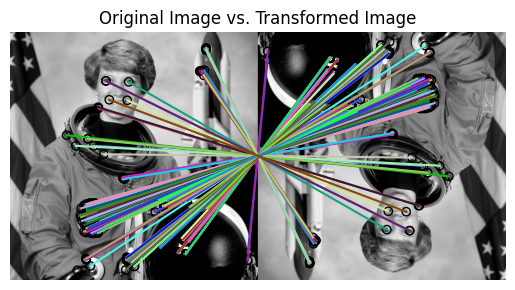

In [9]:
matches12 = feature.match_descriptors(descriptors1, descriptors2, cross_check=True, max_ratio=0.1)
feature.plot_matches(plt, img1, img2, keypoints1, keypoints2, matches12)
plt.axis('off')
plt.title("Original Image vs. Transformed Image")
plt.show()

### Exercise: #1

*   Analyze and discuss the effect of changing the parameter **'max_ratio'** in the match_descriptors function.

**Solution**

By lowering the max_ratio, we reduce the number of false matches, though it also reduces the total number of matches found.

We can adjust this ratio based on prioritizing quality or quantity.

Its hard to see here since the images are the same.

...

*   What do you infer from **'harris_k'**, **'n_scales'**, **'fast_n'**, **'fast_threshold'** parameters in ORB function?

**Solution**

A higher value of harris_k increases the sensitivity of the Harris corner detector to corner points but can also increase the number of falsely detected edges. A lower value reduces sensitivity meaning less corners detected by putting an emphasis on quality.

Increasing n_scales allows the algorithm to detect features over a wider range of scales, enhancing robustness to scale changes. However, this can also increase computational complexity and processing time.

Higher values of fast_n require more contiguous pixels to form a corner, which may reduce the number of detected corners but can improve detection precision. Lower values allow more corners but might increase noise.

Lower fast_threshold values detect more corners, including weak ones, but can introduce more false positives. Higher values detect stronger, more distinct corners but fewer in number.

...

### Exercise: #2
*   Using the above example, create a function get_ORB, that takes two images as parameters and returns the keypoints of both images and descriptor matches

In [10]:
# solution

def get_ORB(img1, img2, n_keypoints=200):
    # Ensure both images are in RGB format if they are RGBA
    if len(img1.shape) == 3 and img1.shape[2] == 4:  # Convert RGBA to RGB
        img1 = color.rgba2rgb(img1)
    if len(img2.shape) == 3 and img2.shape[2] == 4:  # Convert RGBA to RGB
        img2 = color.rgba2rgb(img2)
    
    # Convert images to grayscale if they are RGB
    if len(img1.shape) == 3:
        img1 = color.rgb2gray(img1)
    if len(img2.shape) == 3:
        img2 = color.rgb2gray(img2)
    
    # Initialize ORB detector with the specified number of keypoints
    descriptor_extractor = feature.ORB(n_keypoints=n_keypoints)

    # Detect and extract keypoints and descriptors from the first image
    descriptor_extractor.detect_and_extract(img1)
    keypoints1 = descriptor_extractor.keypoints
    descriptors1 = descriptor_extractor.descriptors

    # Detect and extract keypoints and descriptors from the second image
    descriptor_extractor.detect_and_extract(img2)
    keypoints2 = descriptor_extractor.keypoints
    descriptors2 = descriptor_extractor.descriptors

    # Match descriptors between the two images
    matches12 = feature.match_descriptors(descriptors1, descriptors2, cross_check=True)
    
    return keypoints1, keypoints2, matches12

*   Using the above function, detect the correspondences between the model image 'starbucks.jpg' with the scene image 'starbucks4.jpg'
*   Plot the matches between the two images.

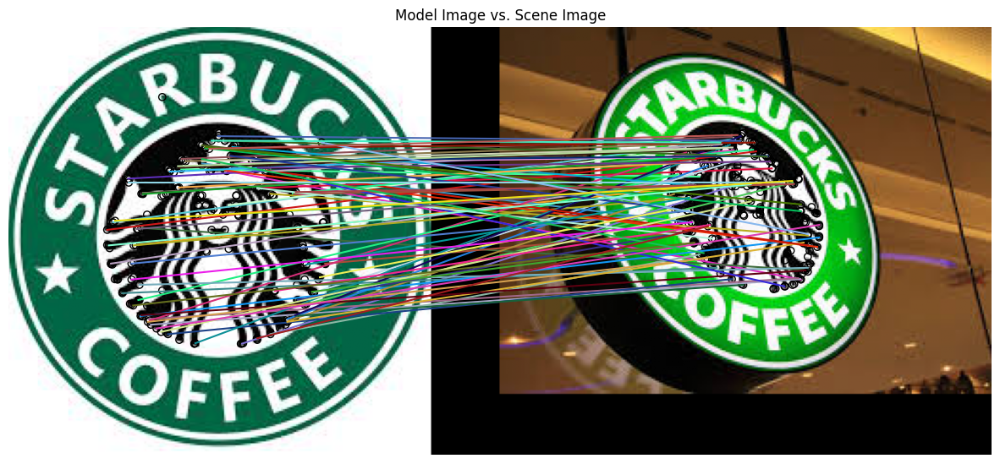

In [11]:
# solution

# Load the images
model_image = io.imread('images/starbucks/starbucks.jpg')
scene_image = io.imread('images/starbucks/starbucks4.jpg')

# Get keypoints and matches using ORB
keypoints1, keypoints2, matches12 = get_ORB(model_image, scene_image)

# Plotting the matches
plt.figure(figsize=(15, 10))
feature.plot_matches(plt, model_image, scene_image, keypoints1, keypoints2, matches12)
plt.axis('off')
plt.title("Model Image vs. Scene Image")
plt.show()

### Exercise: #3

*   Using "starbucks.jpg" image as a model, show its matches to all Starbucks images. 
*   Show the number of the matches for the pair as title for each plot.

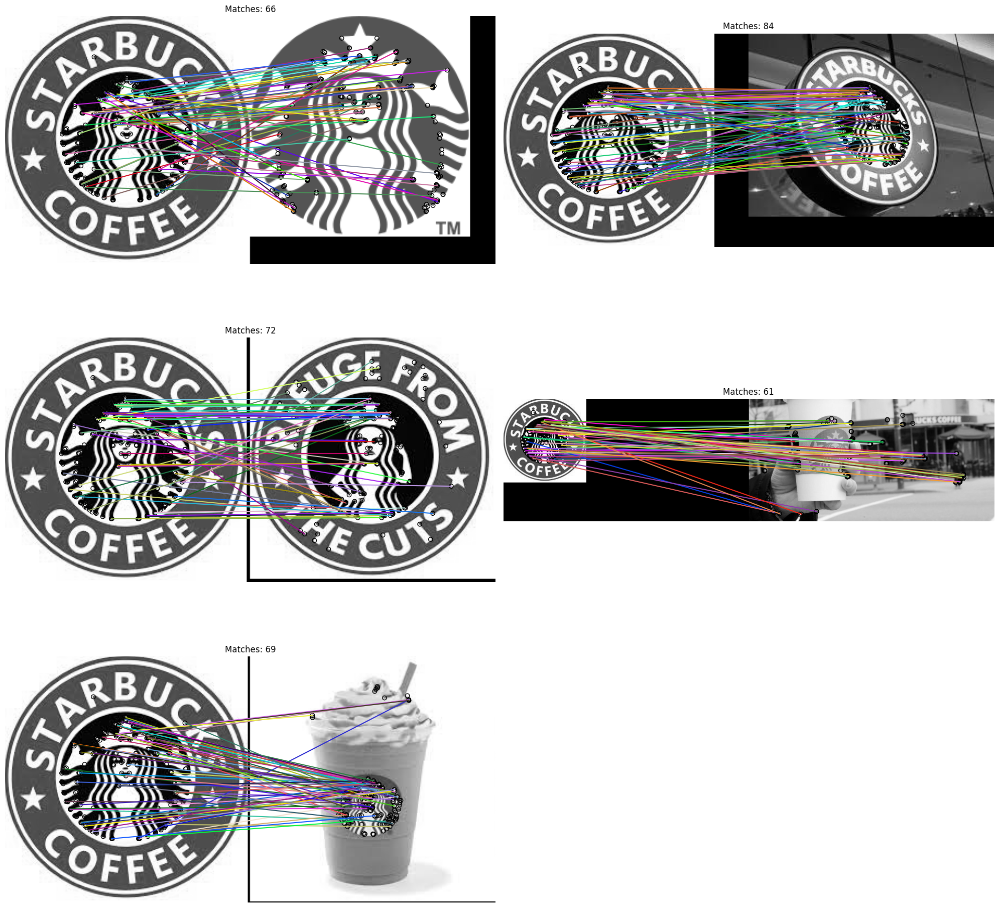

In [12]:
# solution
# Load the model image
model_image = io.imread('images/starbucks/starbucks.jpg')

# List of other Starbucks images
other_images = ['images/starbucks/starbucks2.png', 
                'images/starbucks/starbucks4.jpg', 
                'images/starbucks/starbucks5.png', 
                'images/starbucks/starbucks6.jpg', 
                'images/starbucks/starbucksCup.jpg']

# Ensure model image is RGB if it has an alpha channel
if len(model_image.shape) == 3 and model_image.shape[2] == 4:
    model_image = color.rgba2rgb(model_image)

# Loop through each image, detect matches and plot
plt.figure(figsize=(20, 20))
for i, img_path in enumerate(other_images):
    scene_image = io.imread(img_path)
    
    # Ensure scene image is RGB if it has an alpha channel
    if len(scene_image.shape) == 3 and scene_image.shape[2] == 4:
        scene_image = color.rgba2rgb(scene_image)
    
    keypoints1, keypoints2, matches12 = get_ORB(model_image, scene_image)
    
    # Ensure images are grayscale for ORB
    model_image_gray = color.rgb2gray(model_image) if len(model_image.shape) == 3 else model_image
    scene_image_gray = color.rgb2gray(scene_image) if len(scene_image.shape) == 3 else scene_image
    
    # Ensure images are RGB for plotting
    model_image_rgb = color.gray2rgb(model_image_gray) if len(model_image_gray.shape) == 2 else model_image_gray
    scene_image_rgb = color.gray2rgb(scene_image_gray) if len(scene_image_gray.shape) == 2 else scene_image_gray
    
    # Plotting the matches
    plt.subplot(3, 2, i + 1)
    feature.plot_matches(plt, model_image_rgb, scene_image_rgb, keypoints1, keypoints2, matches12)
    plt.axis('off')
    plt.title(f"Matches: {len(matches12)}")

plt.tight_layout()
plt.show()



*   Comment on the performance of the algorithm with respect to each image. When do you think the algorithm works better?

**Solution**

*(Double-click or enter to edit)*

...

### Exercise: #4

*   Repeate **Exercise #2**, by changing the orientation of the model image by rotating it and comparing it with its original version.
*   Create 8 orientations of the model image by rotating the image by 45&deg; (0, 45, 90, 135, 180, 225, 270, 315). *Hint: You can use the rotate() function from skimage.transform.*

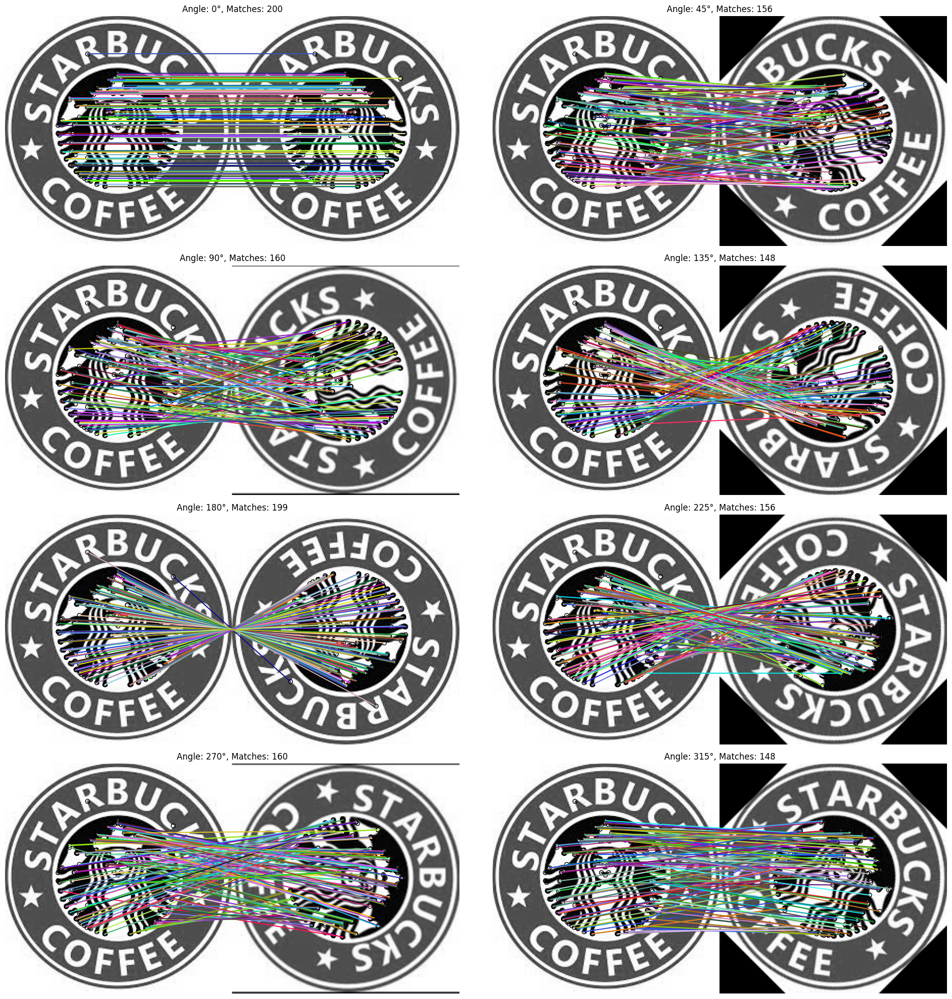

In [13]:
# solution
# Load the model image
model_image = io.imread('images/starbucks/starbucks.jpg')

# Ensure model image is RGB if it has an alpha channel
if len(model_image.shape) == 3 and model_image.shape[2] == 4:
    model_image = color.rgba2rgb(model_image)

# Define rotation angles
angles = [0, 45, 90, 135, 180, 225, 270, 315]

# Loop through each angle, rotate the model image, detect matches and plot
plt.figure(figsize=(20, 20))
for i, angle in enumerate(angles):
    rotated_image = transform.rotate(model_image, angle)
    
    keypoints1, keypoints2, matches12 = get_ORB(model_image, rotated_image)
    
    # Ensure images are grayscale for ORB
    model_image_gray = color.rgb2gray(model_image) if len(model_image.shape) == 3 else model_image
    rotated_image_gray = color.rgb2gray(rotated_image) if len(rotated_image.shape) == 3 else rotated_image
    
    # Ensure images are RGB for plotting
    model_image_rgb = color.gray2rgb(model_image_gray) if len(model_image_gray.shape) == 2 else model_image_gray
    rotated_image_rgb = color.gray2rgb(rotated_image_gray) if len(rotated_image_gray.shape) == 2 else rotated_image_gray
    
    # Plotting the matches
    plt.subplot(4, 2, i + 1)
    feature.plot_matches(plt, model_image_rgb, rotated_image_rgb, keypoints1, keypoints2, matches12)
    plt.axis('off')
    plt.title(f"Angle: {angle}°, Matches: {len(matches12)}")

plt.tight_layout()
plt.show()


*   What do you observe with respect to the change in orientations?

**Solution**

*(Double-click or enter to edit)*

...

### Exercise: #5

*   Repeat **Exercise #3** using Coco-cola images using cocacola_logo.png as the model image.
*   Does the same parameters used for Starbucks images work in this case? Or was it necessary to modify the ORB parameters?

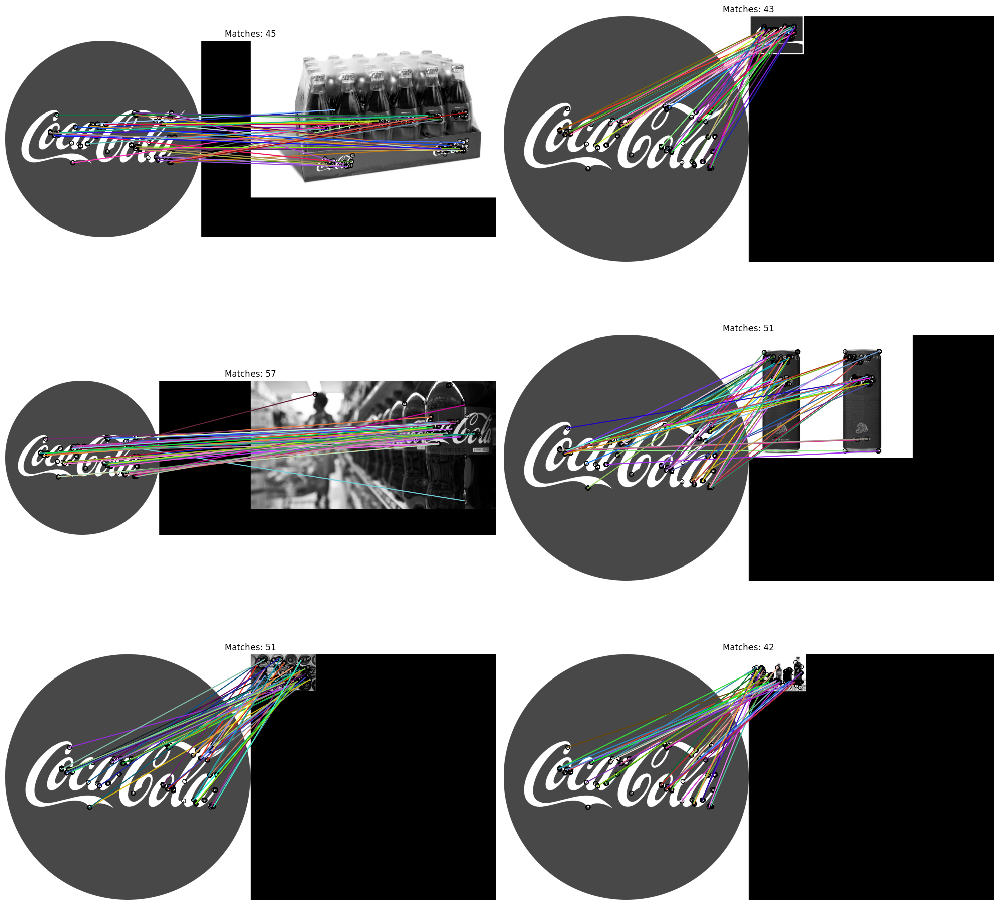

In [14]:
# solution
# Load the model image
model_image = io.imread('images/cocacola/cocacola_logo.png')

# List of other Starbucks images
other_images = ['images/cocacola/cocacola1.jpg', 
                'images/cocacola/cocacola2.png', 
                'images/cocacola/cocacola3.jpg', 
                'images/cocacola/cocacola4.jpg', 
                'images/cocacola/cocacola5.png',
                'images/cocacola/cocacola6.jpg']

# Ensure model image is RGB if it has an alpha channel
if len(model_image.shape) == 3 and model_image.shape[2] == 4:
    model_image = color.rgba2rgb(model_image)

# Loop through each image, detect matches and plot
plt.figure(figsize=(20, 20))
for i, img_path in enumerate(other_images):
    scene_image = io.imread(img_path)
    
    # Ensure scene image is RGB if it has an alpha channel
    if len(scene_image.shape) == 3 and scene_image.shape[2] == 4:
        scene_image = color.rgba2rgb(scene_image)
    
    keypoints1, keypoints2, matches12 = get_ORB(model_image, scene_image)
    
    # Ensure images are grayscale for ORB
    model_image_gray = color.rgb2gray(model_image) if len(model_image.shape) == 3 else model_image
    scene_image_gray = color.rgb2gray(scene_image) if len(scene_image.shape) == 3 else scene_image
    
    # Ensure images are RGB for plotting
    model_image_rgb = color.gray2rgb(model_image_gray) if len(model_image_gray.shape) == 2 else model_image_gray
    scene_image_rgb = color.gray2rgb(scene_image_gray) if len(scene_image_gray.shape) == 2 else scene_image_gray
    
    # Plotting the matches
    plt.subplot(3, 2, i + 1)
    feature.plot_matches(plt, model_image_rgb, scene_image_rgb, keypoints1, keypoints2, matches12)
    plt.axis('off')
    plt.title(f"Matches: {len(matches12)}")

plt.tight_layout()
plt.show()


**Solution**

*(Double-click or enter to edit)*

...

### Exercise #6. Analysis of the applied techniques and results

*   What are the advantages of ORB object detection compared with HOG object detector?

**Solution**

*(Double-click or enter to edit)*

...

*   What would happen if you analyse an image that does not contain the Starbucks logo (as is the case of "edificio.jpg")?

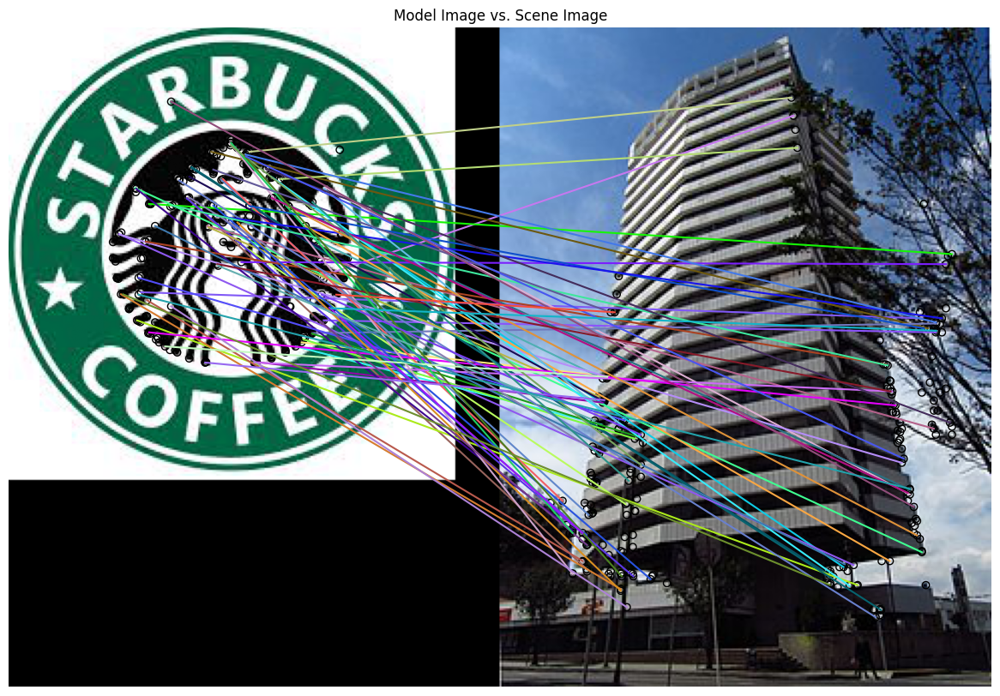

In [15]:
# solution

# Load the images
model_image = io.imread('images/starbucks/starbucks.jpg')
scene_image = io.imread('images/edificio.jpg')

# Get keypoints and matches using ORB
keypoints1, keypoints2, matches12 = get_ORB(model_image, scene_image)

# Plotting the matches
plt.figure(figsize=(15, 10))
feature.plot_matches(plt, model_image, scene_image, keypoints1, keypoints2, matches12)
plt.axis('off')
plt.title("Model Image vs. Scene Image")
plt.show()

**Solution**

*(Double-click or enter to edit)*

...

*   What are the different ways of defining a quality measure for the correspondance between two images? (implementation of measures is not necessary)?

**Solution**

*(Double-click or enter to edit)*

...

# Panorama Stitching (Not graded)

Image Mosaicing is a technique of combining multiple overlapping images into a single image.

*   A simple tutorial can be found in this notebook: 
*   https://github.com/scikit-image/skimage-tutorials/blob/main/lectures/solutions/adv3_panorama-stitching-solution.ipynb